# Detecção de Alvos lineares em imagens de Sonar - Teste Parameters

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

Processing 204145.png


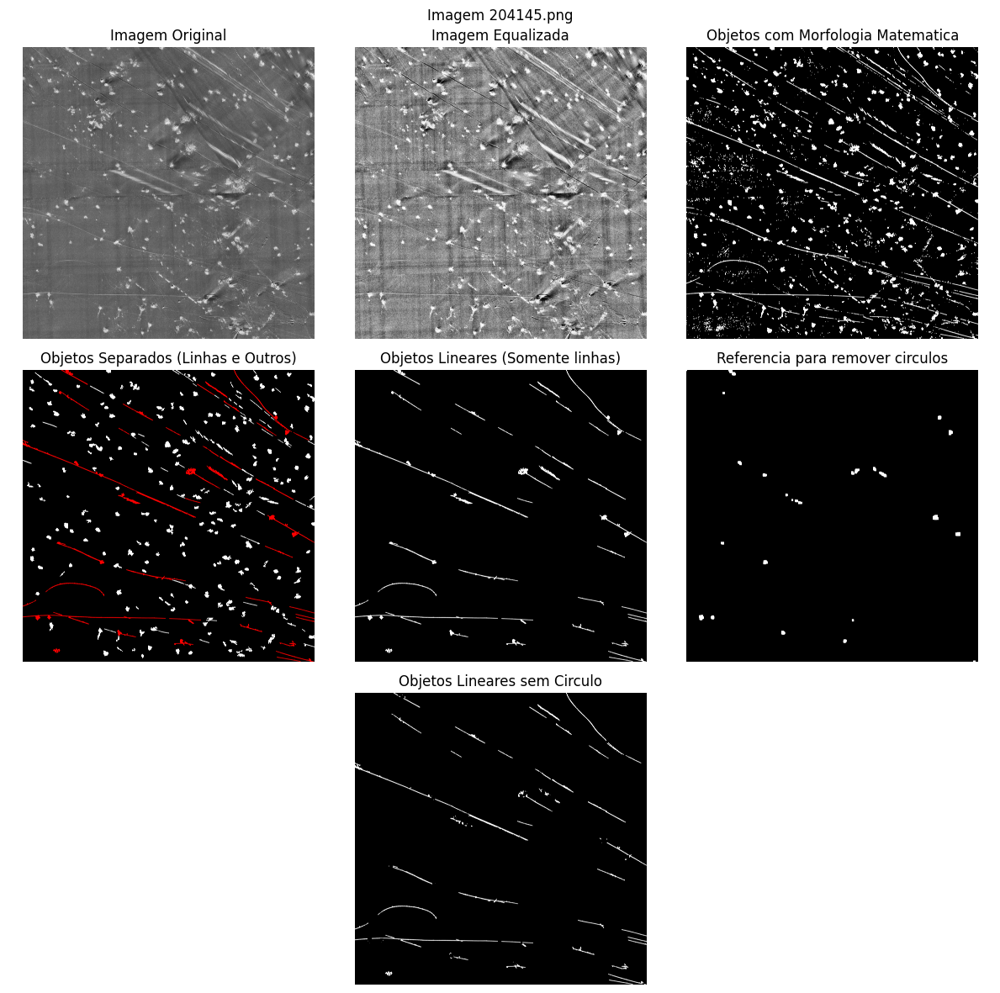




Processing 204146.png


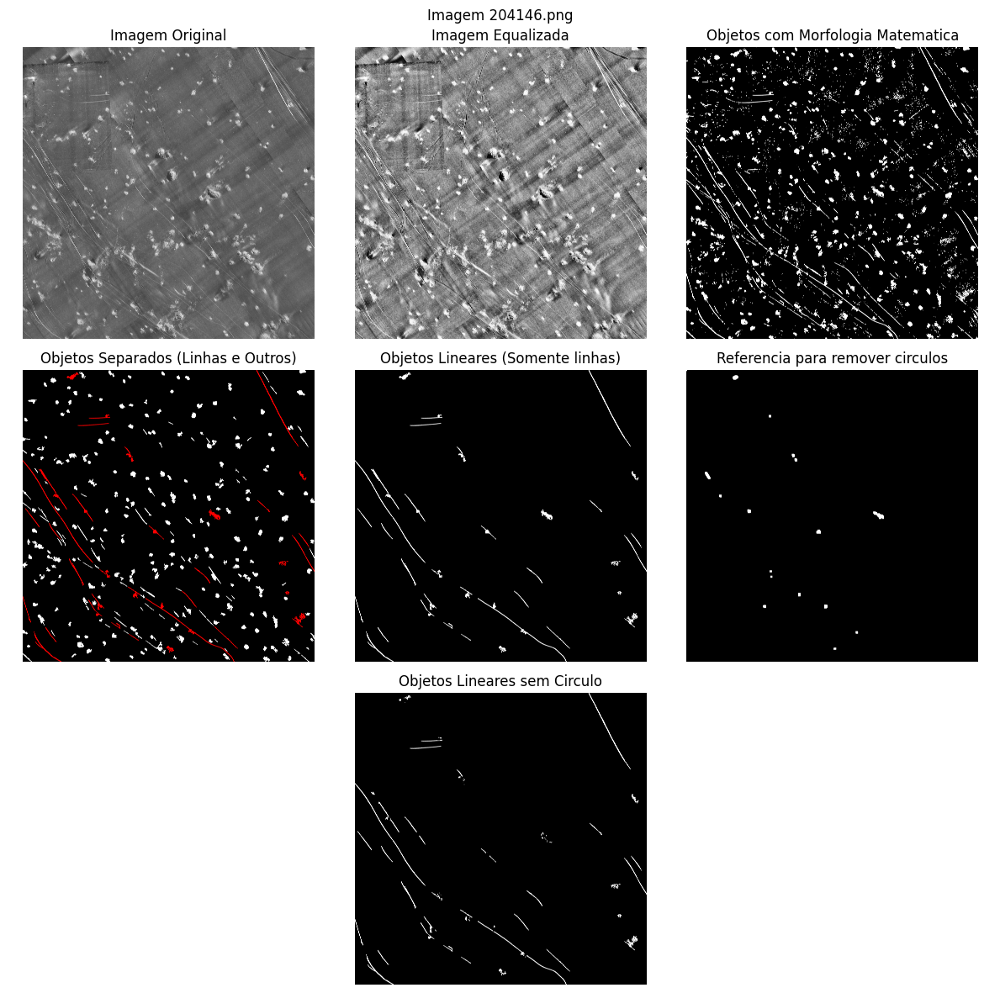




Processing 204147.png


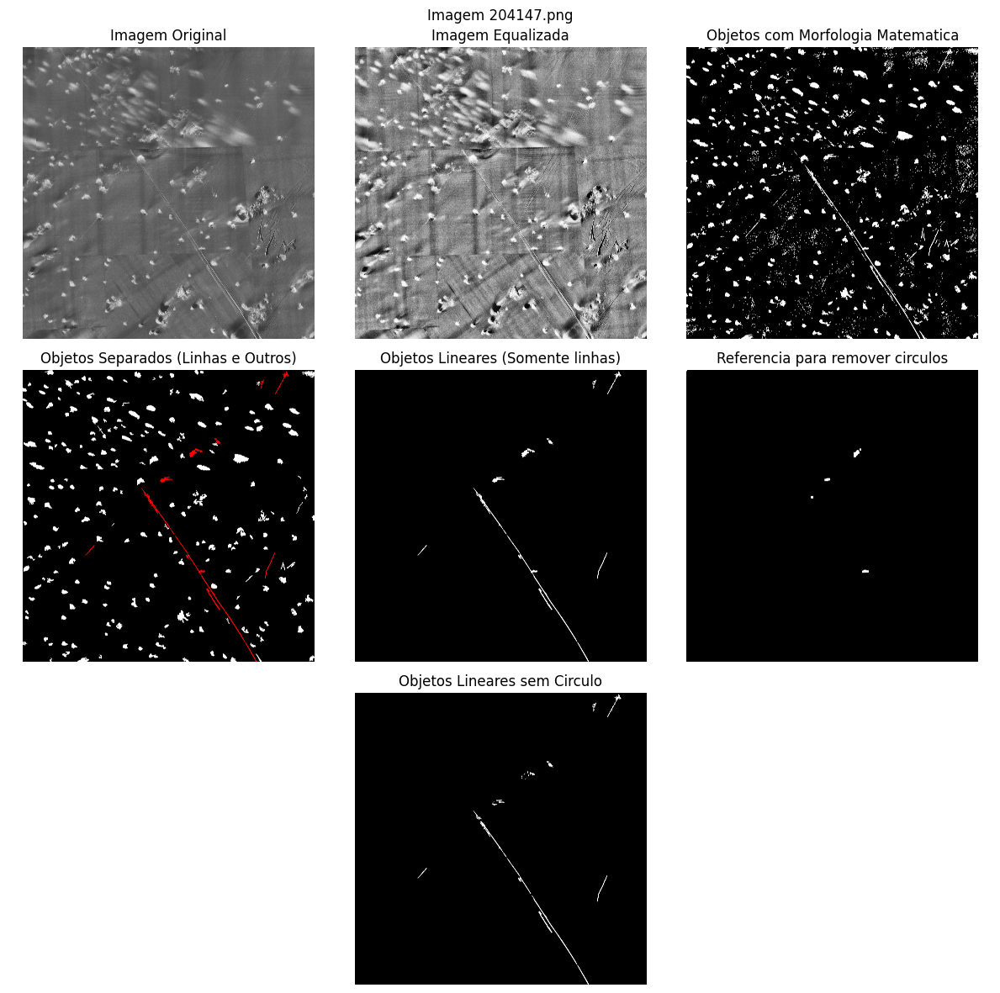




Processing 205141.png


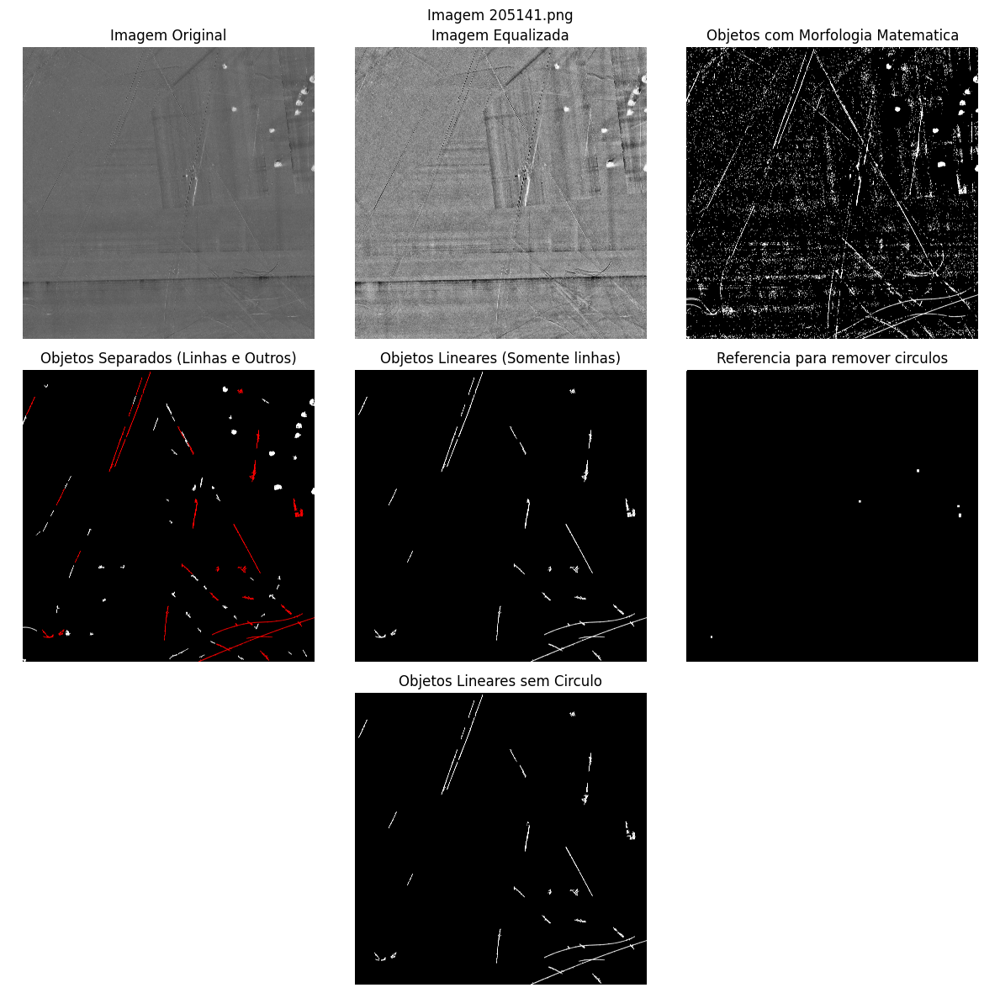




Processing 205142.png


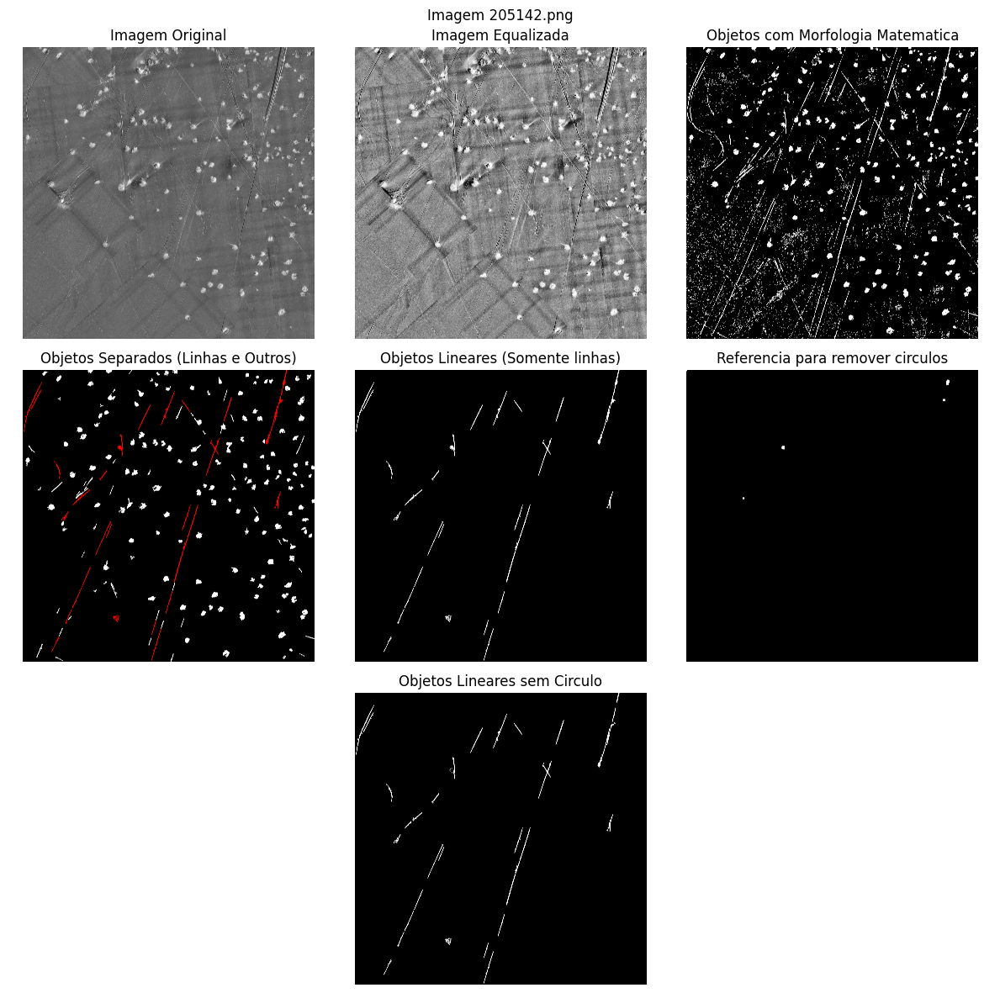




Processing 205143.png


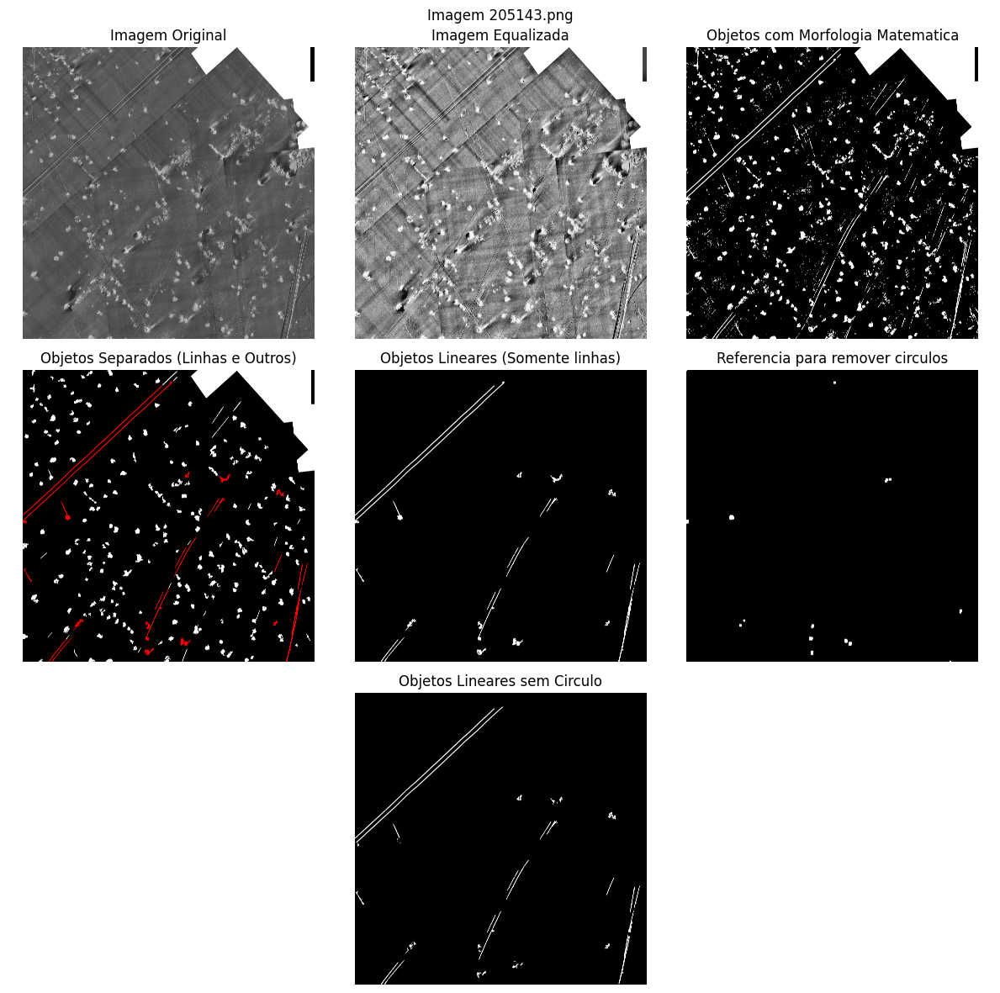




Processing 213143.png


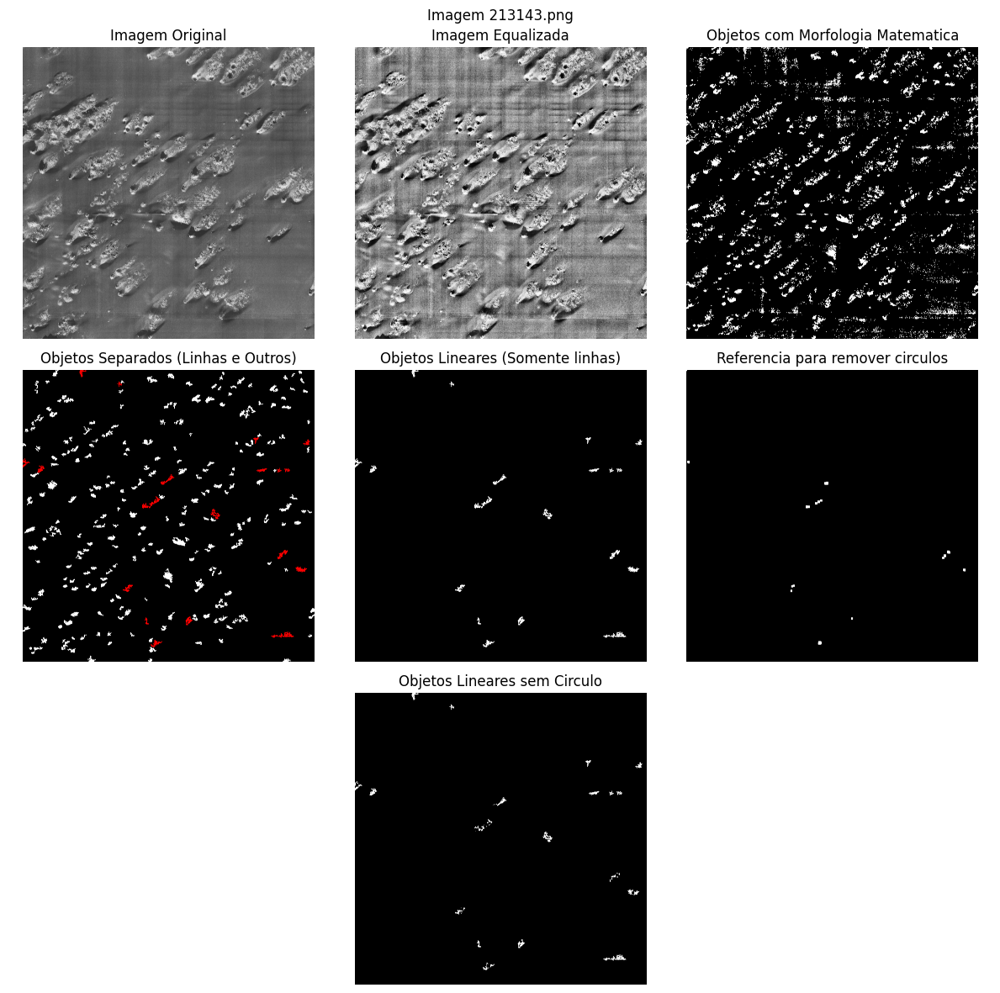




Processing 213144.png


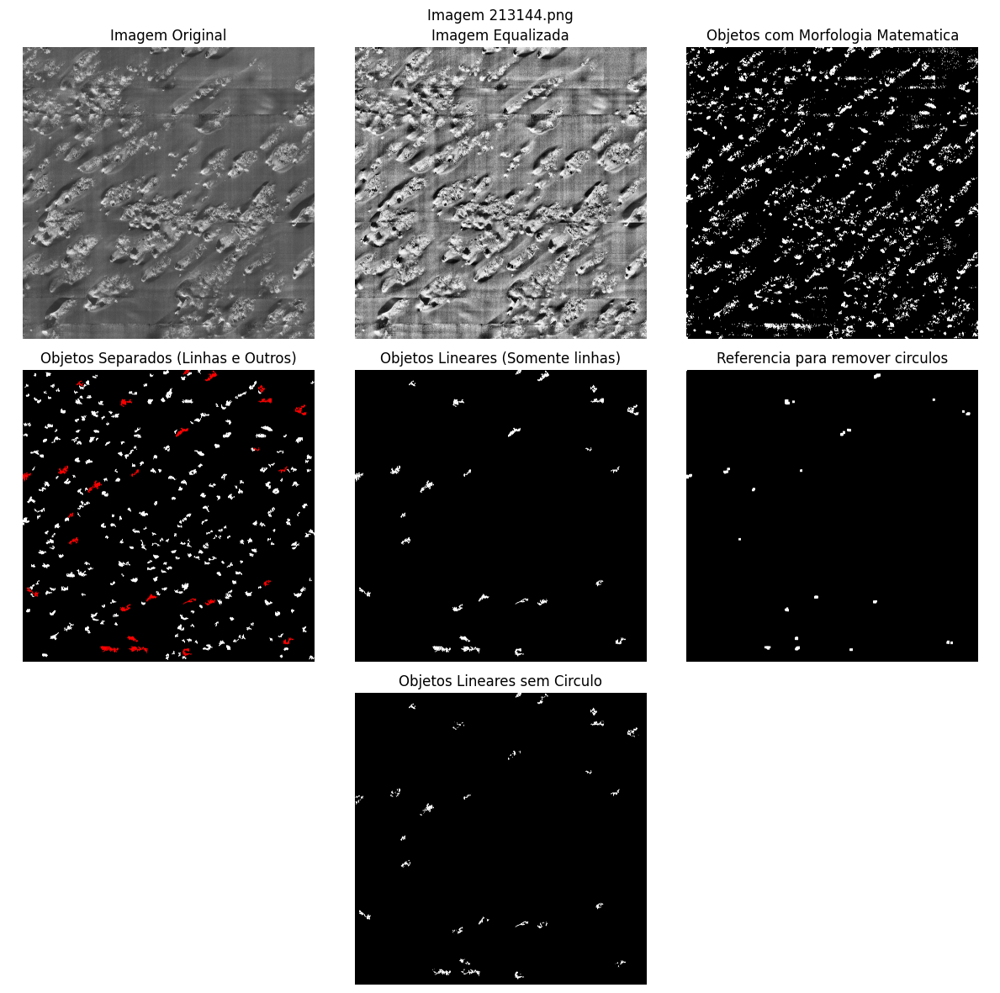




Processing 213145.png


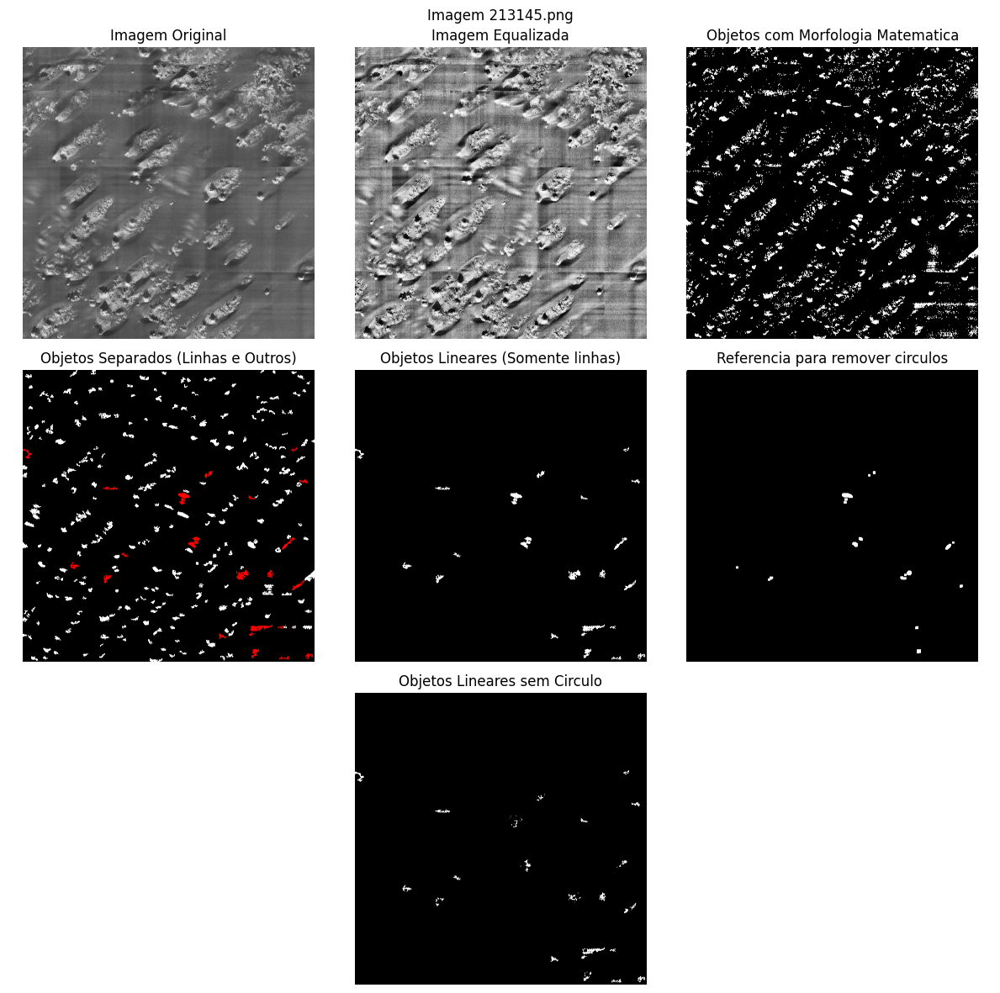




Processing 435383.png


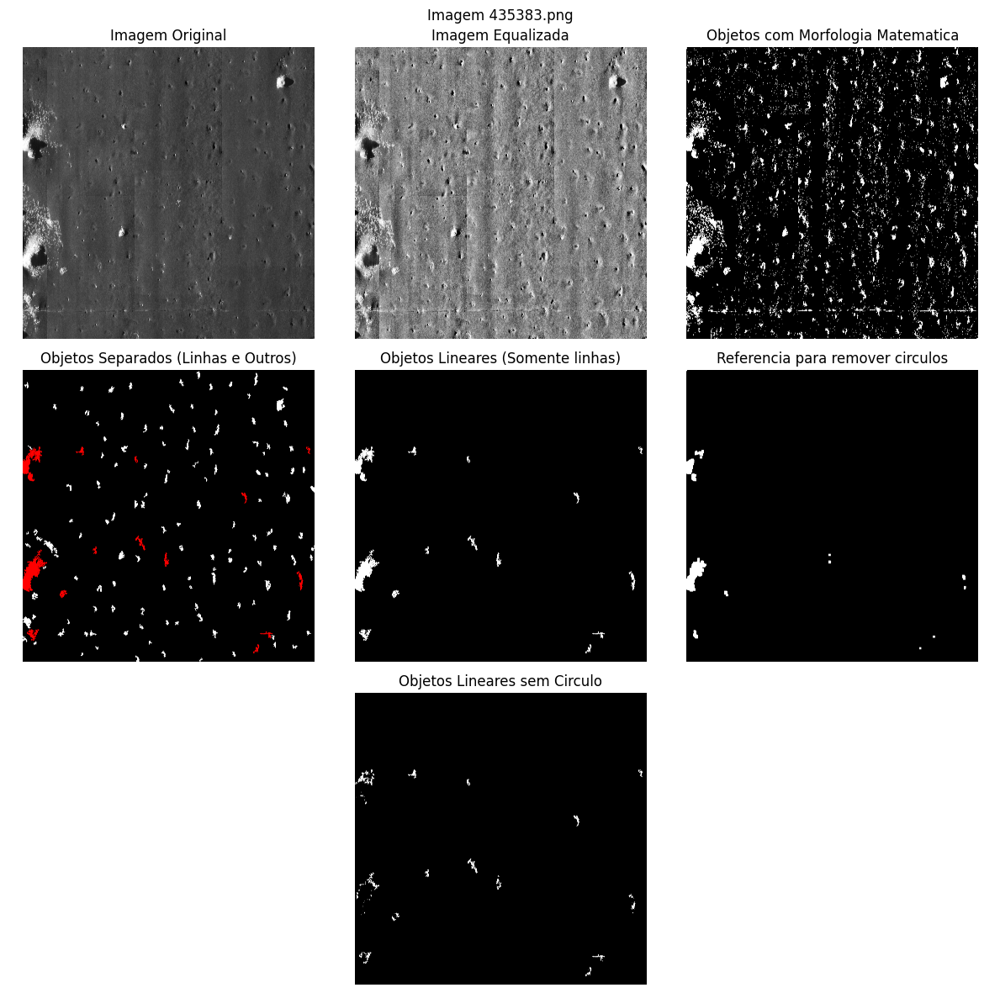




Processing 435384.png


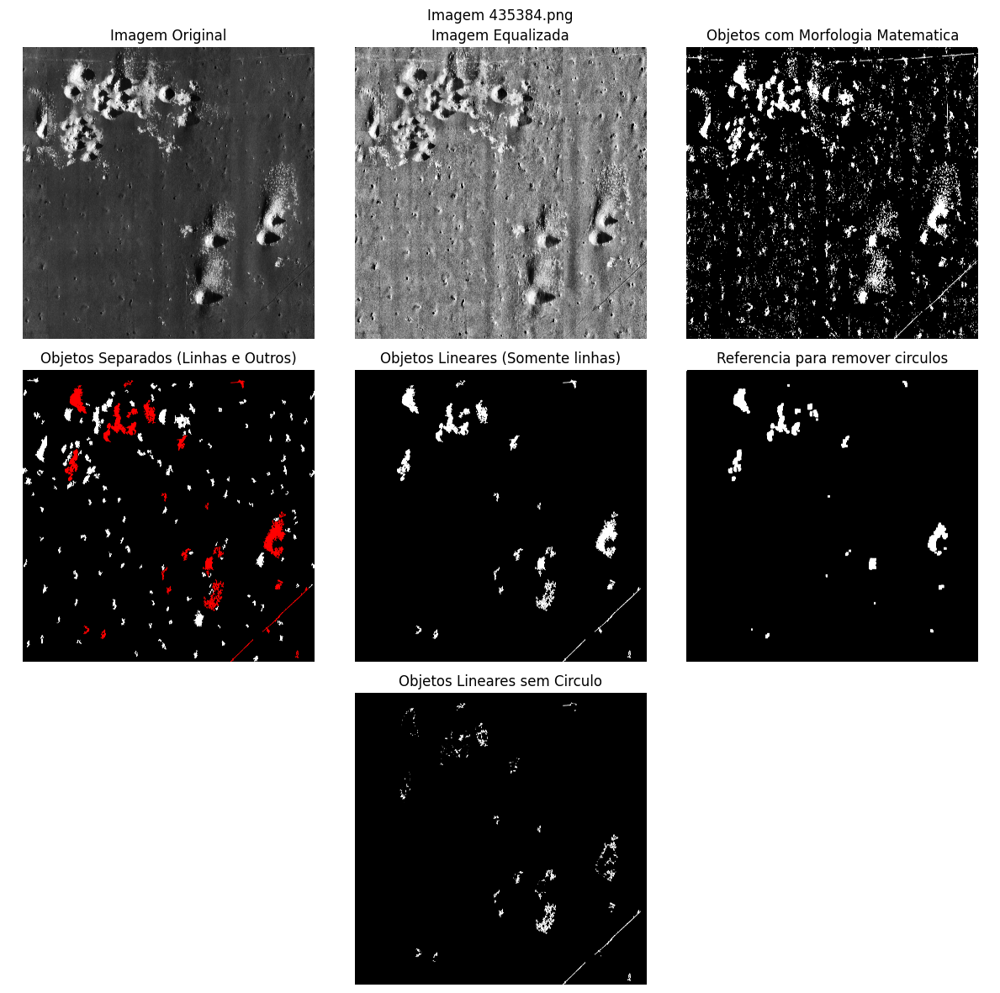




Processing 435387.png


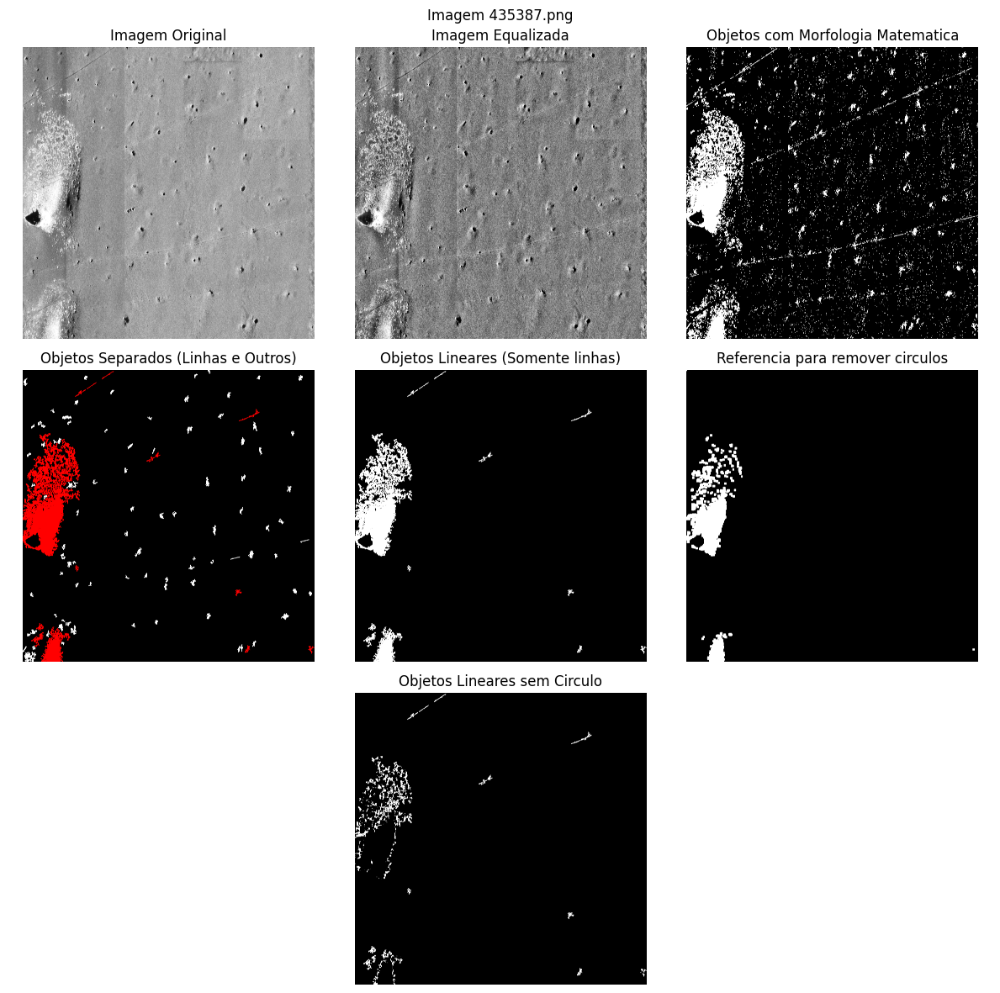




Processing 435388.png


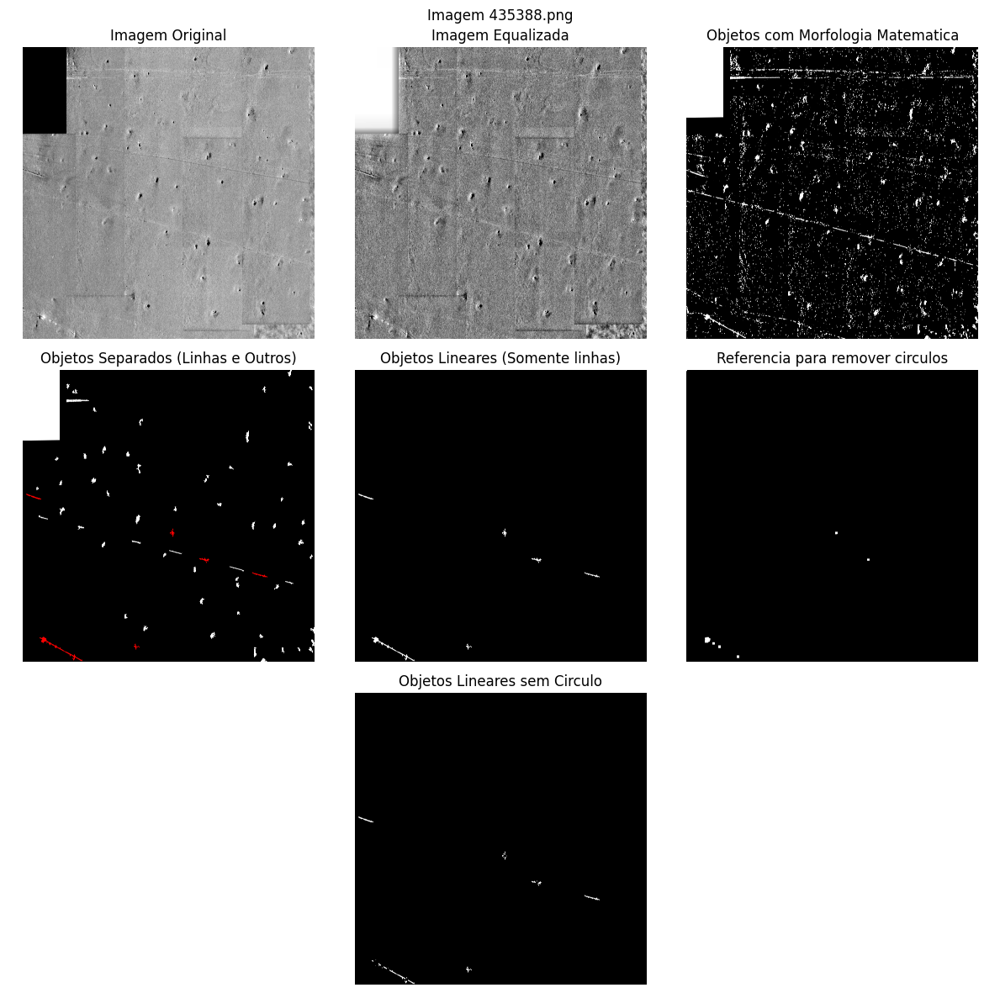




Processing 435393.png


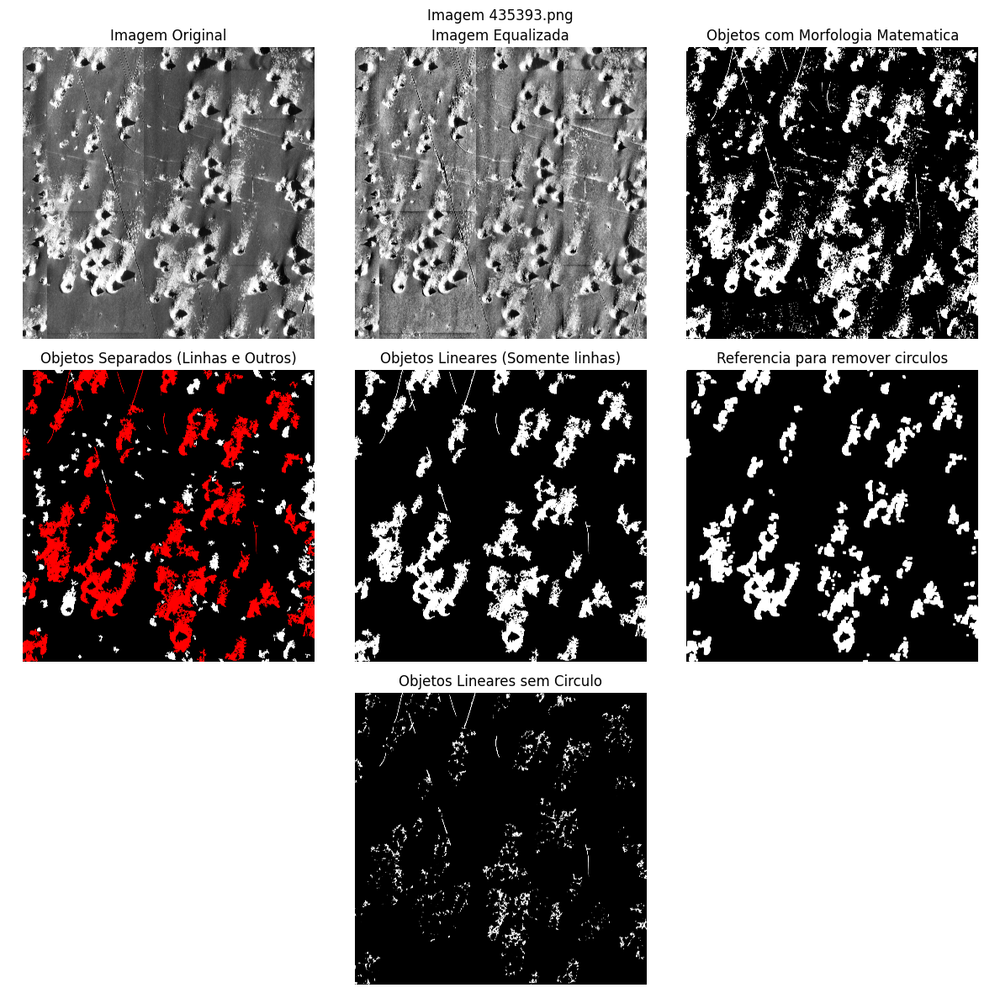




Processing 435394.png


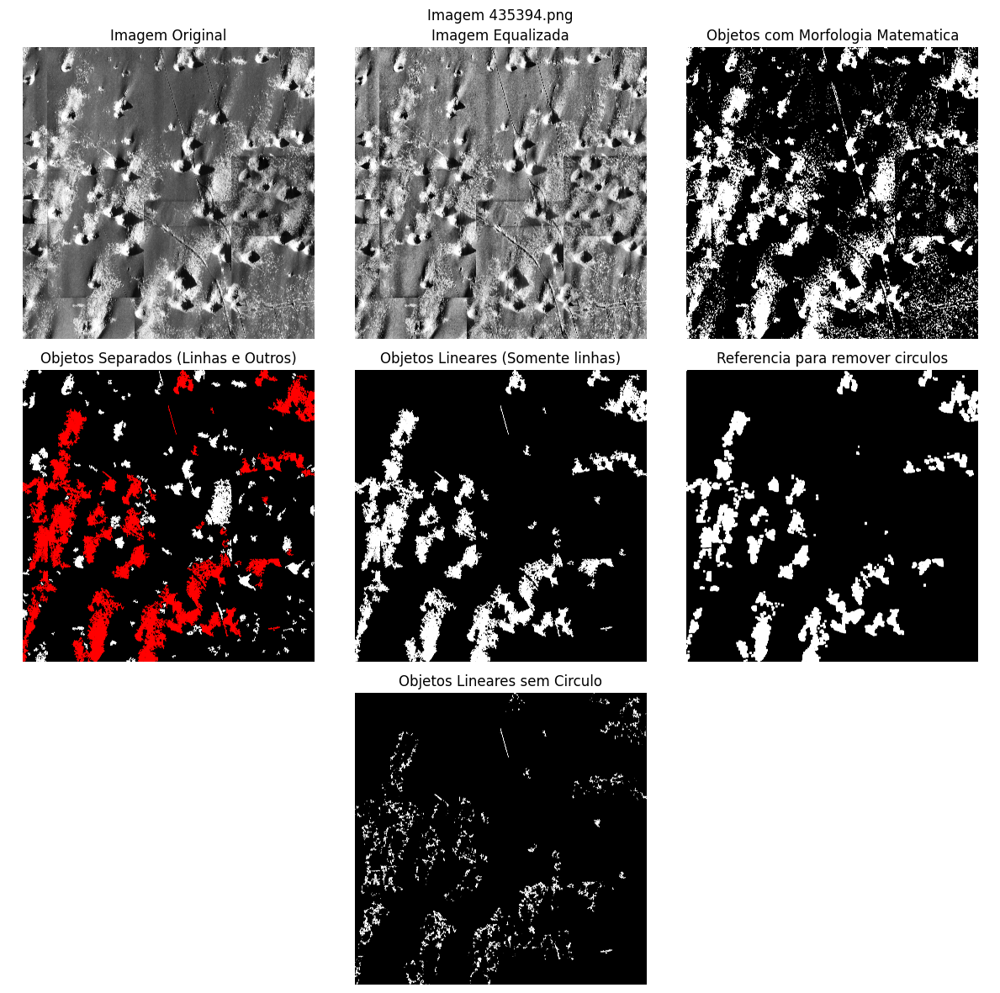




Processing 435395.png


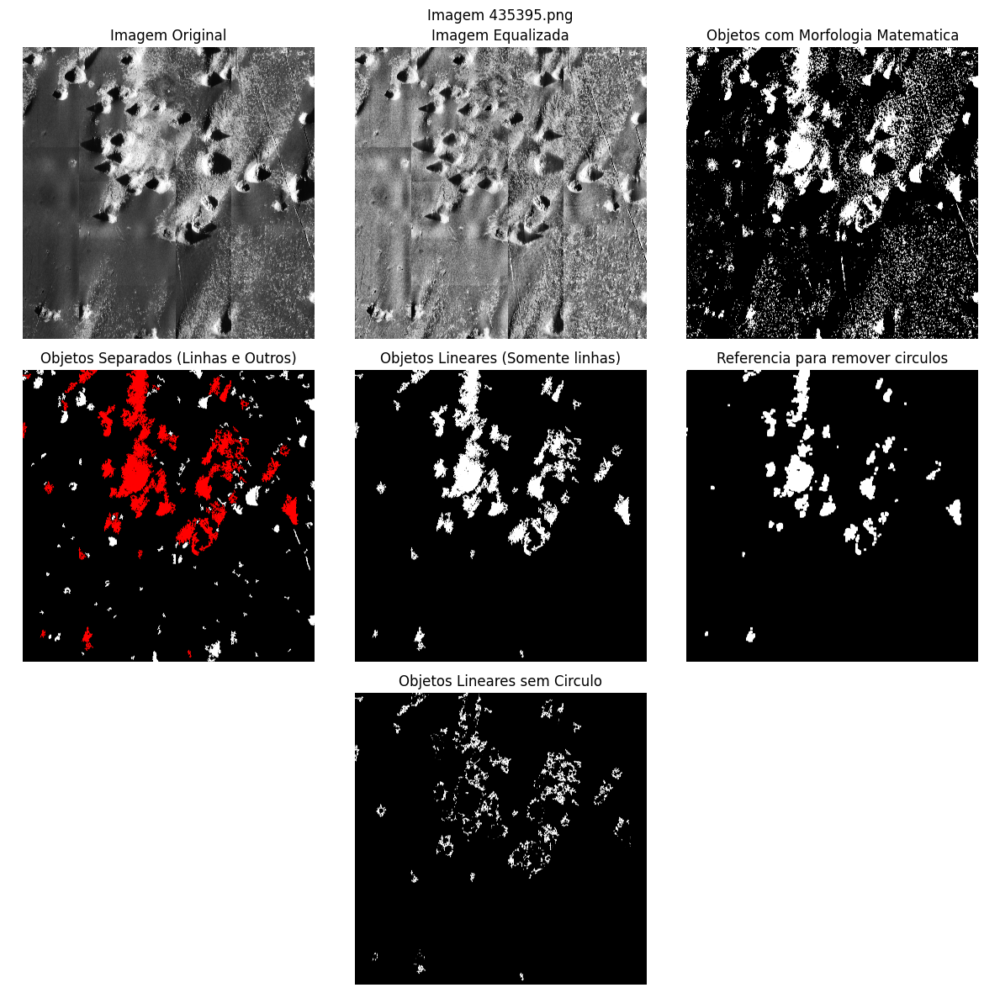




Processing 435396.png


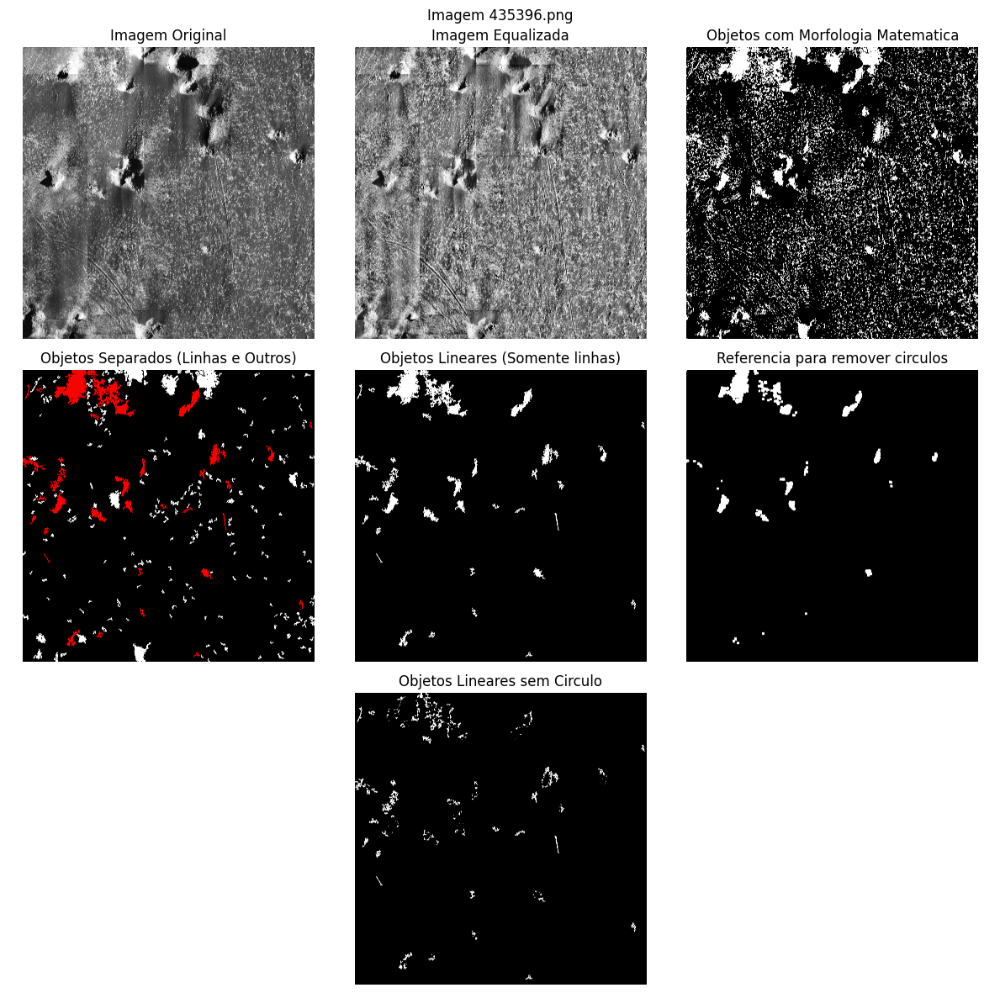




Processing 435397.png


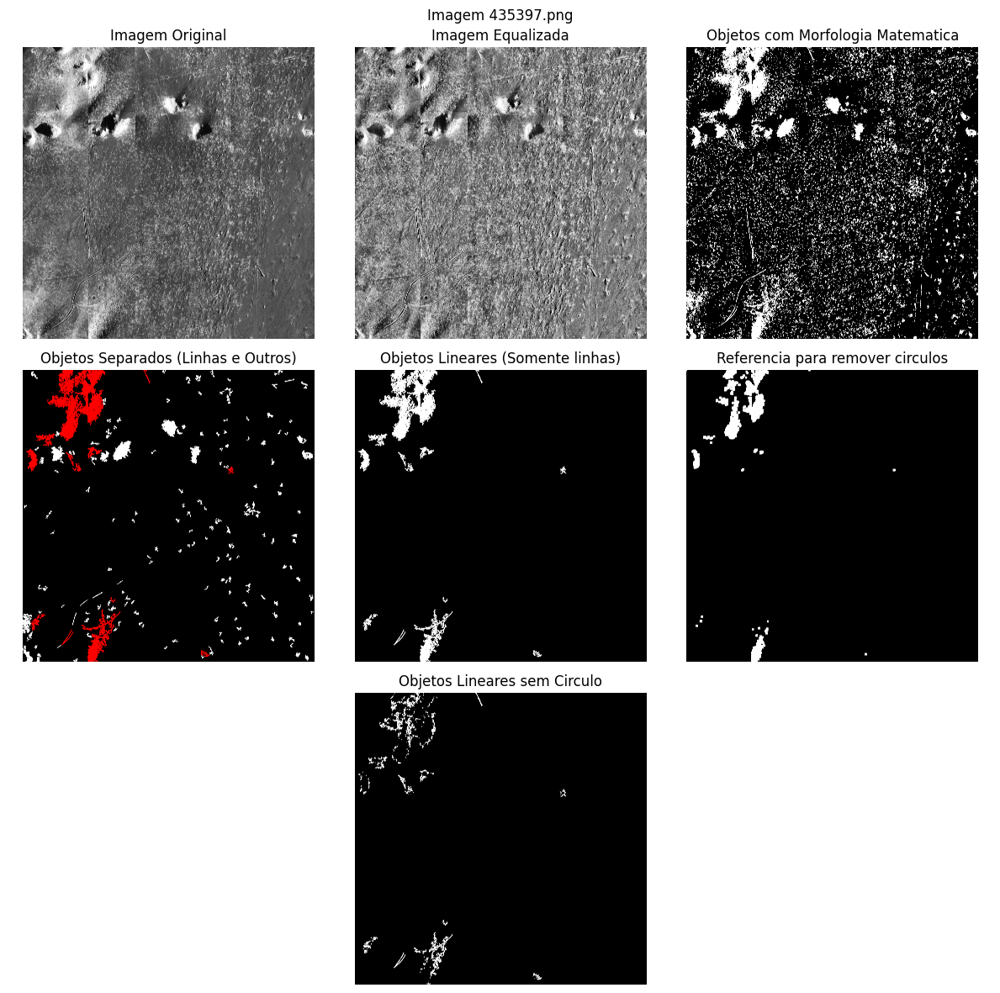




Processing 435398.png


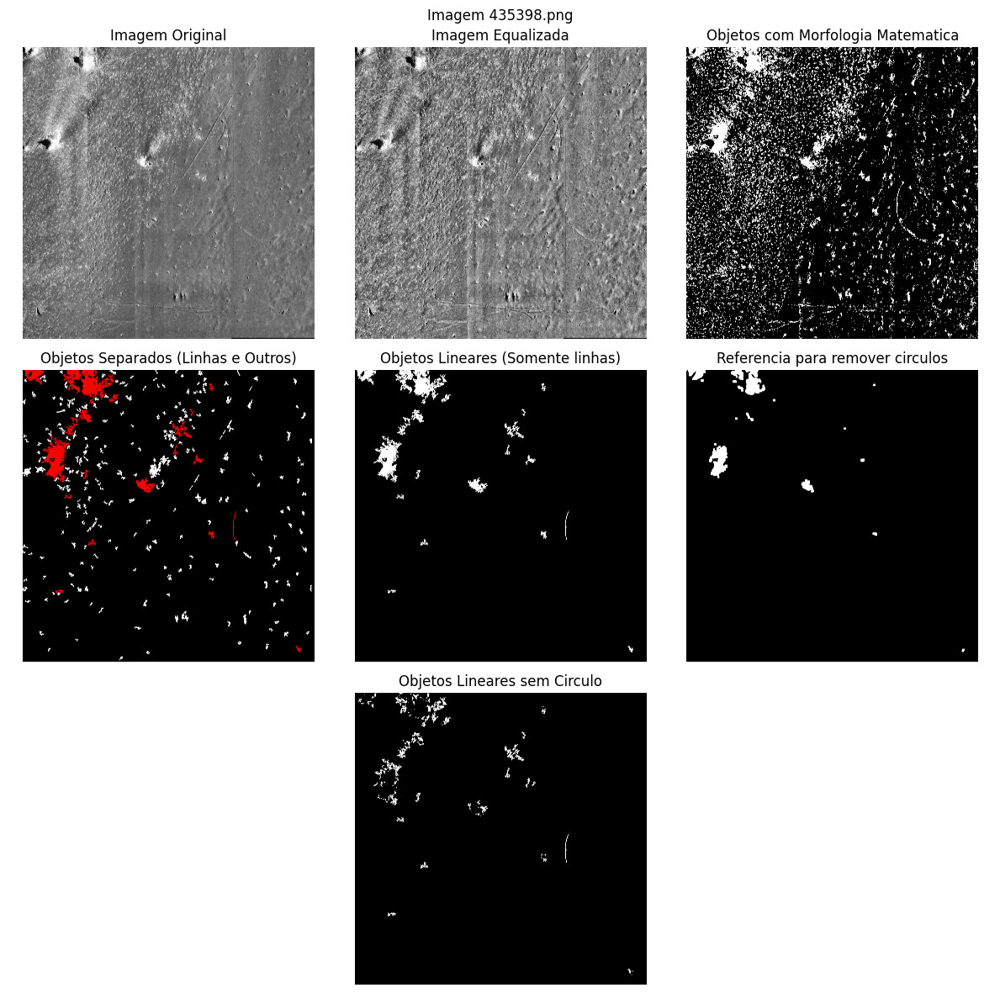




Processing 436395.png


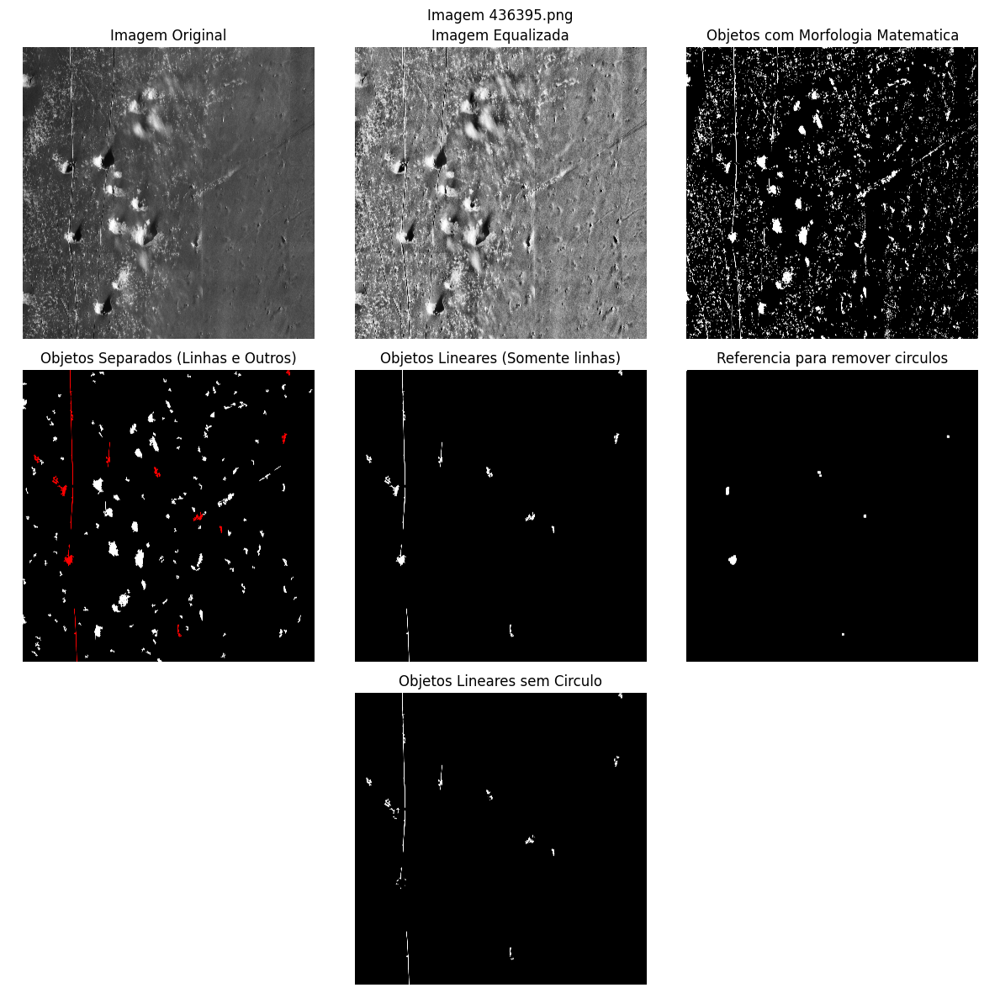




Processing 436396.png


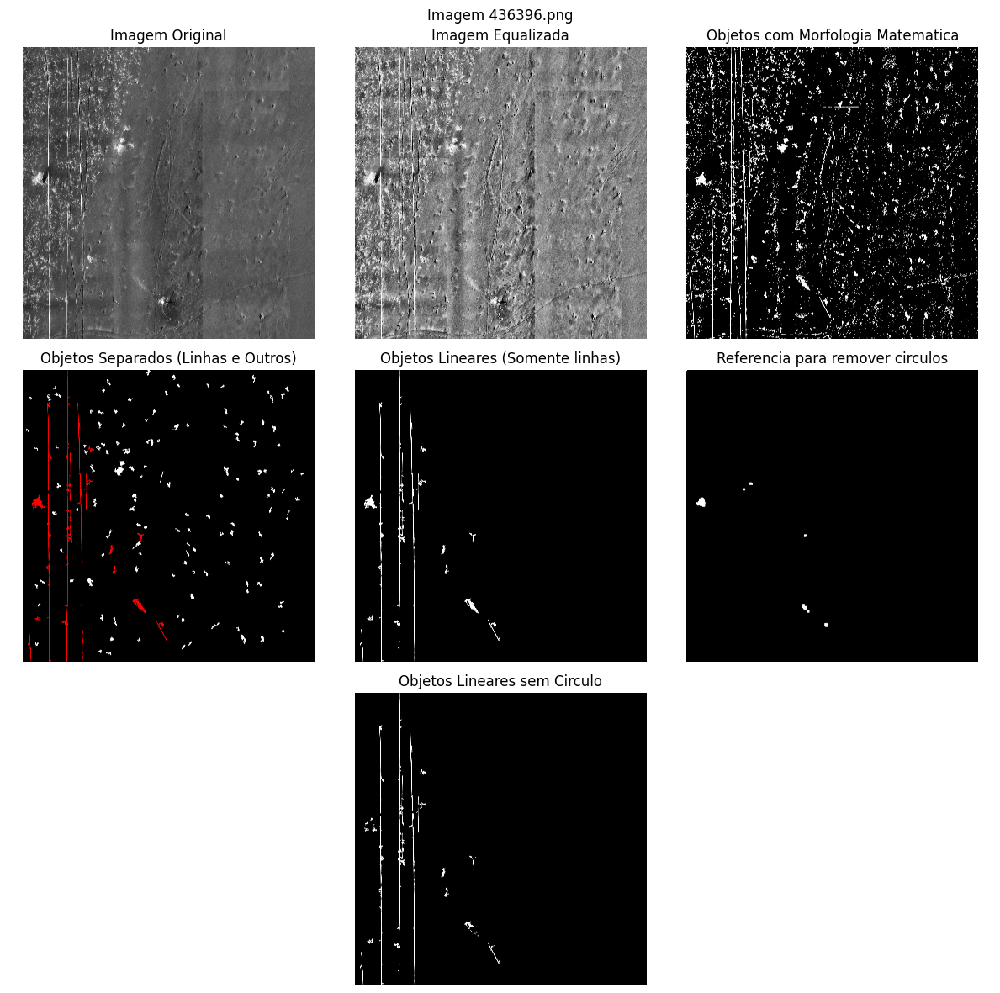




Processing 436397.png


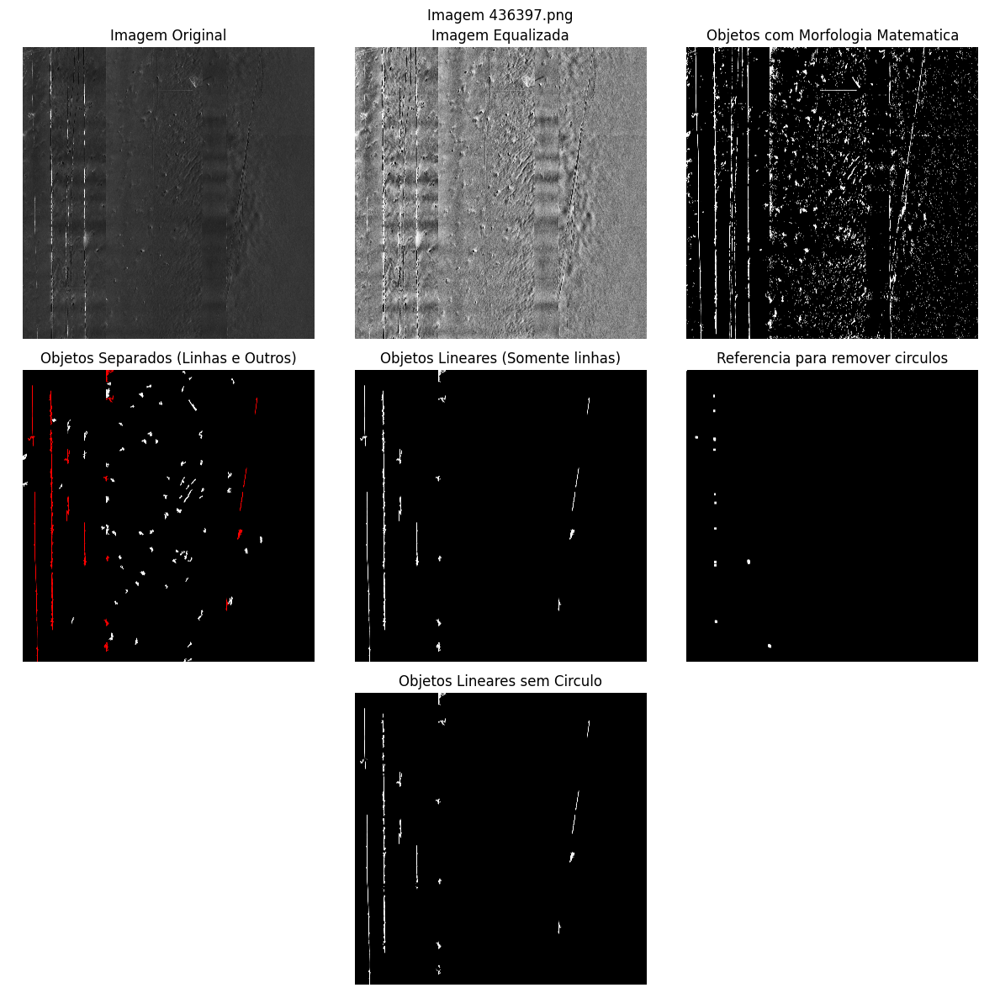

In [2]:
# Imports
import os
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt
from skimage import exposure
from skimage.measure import label, regionprops
from skimage.color import label2rgb
from skimage import filters
from skimage.filters import threshold_otsu, threshold_local, threshold_minimum

# Constants
PATH_IMAGES = "images/"
THRESHOLD_MORPHOLOGY = 250

# List All Images
images = [file for file in os.listdir(PATH_IMAGES) if file.endswith(".png")]
images.sort()

# For each images
for file_image in images:
    print("Processing", file_image)
    path = os.path.join(PATH_IMAGES, file_image)

    # Load image
    raw_image = cv.imread(path)[:, :, 0]

    # Step 1: Local Histogram Equalization
    KERNEL_LEN = ( raw_image.shape[0] // 20, raw_image.shape[1] // 20 )
    cl1 = exposure.equalize_adapthist( raw_image, kernel_size = KERNEL_LEN, clip_limit=1 )
    cl1 = (cl1*255).astype(np.uint8)


    # Step 2: Detect Lines with Morphology

    ## Detect Horizontal Lines with Morphology
    line_size = cl1.shape[1] // 500
    horizontal_structure = cv.getStructuringElement(cv.MORPH_RECT, (line_size, 1))
    horizontal = cv.dilate(cl1, horizontal_structure)
    horizontal = cv.morphologyEx(horizontal, cv.MORPH_OPEN, horizontal_structure)
    horizontal_threshold = (horizontal >= THRESHOLD_MORPHOLOGY).astype(np.uint8)
    
    ## Detect Vertical Lines with Morphology
    vertical_structure = cv.getStructuringElement(cv.MORPH_RECT, (1, line_size))
    vertical = cv.dilate(cl1, vertical_structure)
    vertical = cv.morphologyEx(vertical, cv.MORPH_OPEN, vertical_structure)
    vertical_threshold = (vertical >= THRESHOLD_MORPHOLOGY).astype(np.uint8)
    
    ## Detect Diagonal Lines With Morphology
    diagonal_structure_right = np.diag(np.ones(line_size)).astype(np.uint8)
    diagonal_structure_left = np.fliplr(diagonal_structure_right)
    diagonal_right = cv.dilate(cl1, diagonal_structure_right)
    diagonal_right = cv.morphologyEx(diagonal_right, cv.MORPH_OPEN, diagonal_structure_right)
    diagonal_right_threshold = (diagonal_right >= THRESHOLD_MORPHOLOGY).astype(np.uint8)
    diagonal_left = cv.dilate(cl1, diagonal_structure_left)
    diagonal_left = cv.morphologyEx(diagonal_left, cv.MORPH_OPEN, diagonal_structure_left)
    diagonal_left_threshold = (diagonal_left >= THRESHOLD_MORPHOLOGY).astype(np.uint8)
    
    ## Union Detect Lines
    lines_horizontal_vertical = cv.bitwise_or(horizontal_threshold, vertical_threshold)
    lines_diagonal = cv.bitwise_or(diagonal_left_threshold, diagonal_right_threshold)
    lines_raw = cv.bitwise_or(lines_horizontal_vertical, lines_diagonal)
    
    ## Remove small objects
    kernel = np.ones((13,13), np.uint8)
    lines_threshold = cv.morphologyEx(lines_raw, cv.MORPH_OPEN, kernel, iterations = 1)
    

    # STEP 3: Detect only lines with connected components

    ## Generate labels
    label_image = label(lines_threshold)
    
    ## Propriedades dos componentes conectados
    properties = regionprops(label_image)
    
    ## Detect only lines
    ### Parâmetros ajustáveis
    MIN_WIDTH_HEIGHT = 100 ### Largura minima
    ROUNDNESS_THRESHOLD = 0.1  ### Limite de arredondamento para objetos arredondados
    # LINEAR_ASPECT_RATIO_THRESHOLD = 0.8  ### Limite de razão de aspecto para objetos lineares
    EXTENSION_THRESHOLD = 8.5  ### Limite de extensão para objetos lineares
    AREA_WIDTH_HEIGHT_THRESHOLD = 0.5 ### Limite da area em relação a altura e largura do objeto
    
    ### Generate mask with zeros
    lines_mask = np.zeros_like(raw_image)
    
    ### Processing for each region
    for region in properties:
        # Calcular a bounding box e as características geométricas
        minr, minc, maxr, maxc = region.bbox
        width = maxc - minc
        height = maxr - minr
    
        if (width < MIN_WIDTH_HEIGHT) or (height < MIN_WIDTH_HEIGHT):
            continue
    
        # Calcular a razão de aspecto (invariante à orientação)
        # if height > 0:
        #     aspect_ratio = width / height
        # else:
        #     aspect_ratio = 0
    
        # Calcular a arredondamento
        if region.perimeter > 0:
            roundness = (4 * np.pi * region.area) / (region.perimeter ** 2)
        else:
            roundness = 0
    
        # Calcular a extensão (elongation)
        if region.perimeter > 0:
            extension = region.area / region.perimeter
        else:
            extension = 0
    
        # Area em relação a altura e largura do objeto
        area_width_height = region.area / (width * height)

        # Definir limiares para classificar objetos arredondados e lineares
        # if \
        #     (aspect_ratio >= LINEAR_ASPECT_RATIO_THRESHOLD) and \
        #     (extension >= EXTENSION_THRESHOLD) and \
        #     (roundness < ROUNDNESS_THRESHOLD) and \
        #     (area_width_height < AREA_WIDTH_HEIGHT_THRESHOLD):
        #     # Objeto linear
        #     lines_mask[label_image == region.label] = 1
        # else:
        #     # Outro objeto
        #     lines_mask[label_image == region.label] = 2

        # Condicional sem o aspect ratio (ASPECT RATIO ESTAVA LIMITANDO AS LINHAS VERTICAIS)
        if \
            (extension >= EXTENSION_THRESHOLD) and \
            (roundness <= ROUNDNESS_THRESHOLD) and \
            (area_width_height <= AREA_WIDTH_HEIGHT_THRESHOLD):
            # Objeto linear
            lines_mask[label_image == region.label] = 1
        else:
            # Outro objeto
            lines_mask[label_image == region.label] = 2

    # Generate label to rgb to plot
    lines_mask_rgb = label2rgb(lines_mask, colors = [(255, 0, 0), (255, 255, 255)]).astype(np.uint8)
    
    # Convert lines_mask to plot
    lines_mask_binary = np.where(lines_mask == 1, 255, 0).astype(np.uint8)
    
    # STEP 4: Remove circle objects
    
    # Erode to remove lines
    remove_lines = cv.morphologyEx(lines_mask_binary, cv.MORPH_ERODE, horizontal_structure)
    remove_lines = cv.morphologyEx(remove_lines, cv.MORPH_ERODE, vertical_structure)
    remove_lines = cv.morphologyEx(remove_lines, cv.MORPH_ERODE, diagonal_structure_right)
    remove_lines = cv.morphologyEx(remove_lines, cv.MORPH_ERODE, diagonal_structure_left)
    
    # Dilate to upper circle
    kernel_circle = cv.getStructuringElement(cv.MORPH_RECT, (71,71))
    remove_lines = cv.morphologyEx(remove_lines, cv.MORPH_DILATE, kernel_circle)
    
    # Remove circles in line detect
    lines_without_circle = lines_mask_binary * cv.bitwise_not(remove_lines)
    
    # Plot images
    fig, ax = plt.subplots(3, 3, figsize=(12, 12))
    
    ax[0][0].imshow(raw_image, cmap='gray')
    ax[0][0].set_title('Imagem Original')
    ax[0][0].axis('off')

    ax[0][1].imshow(cl1, cmap='gray')
    ax[0][1].set_title('Imagem Equalizada')
    ax[0][1].axis('off')
    
    ax[0][2].imshow(lines_threshold, cmap='gray')
    ax[0][2].set_title('Objetos com Morfologia Matematica')
    ax[0][2].axis('off')
    
    ax[1][0].imshow(lines_mask_rgb)
    ax[1][0].set_title('Objetos Separados (Linhas e Outros)')
    ax[1][0].axis('off')
    
    ax[1][1].imshow(lines_mask_binary, cmap = "gray")
    ax[1][1].set_title('Objetos Lineares (Somente linhas)')
    ax[1][1].axis('off')
    
    ax[1][2].imshow(remove_lines, cmap = "gray")
    ax[1][2].set_title('Referencia para remover circulos')
    ax[1][2].axis('off')
    
    ax[2][1].imshow(lines_without_circle, cmap = "gray")
    ax[2][1].set_title('Objetos Lineares sem Circulo')
    ax[2][1].axis('off')
    ax[2][0].axis('off')
    ax[2][2].axis('off')
    
    fig.suptitle(f"Imagem {file_image}")
    plt.tight_layout()
    plt.savefig(f"output_v2/{file_image}")
    plt.show()

    print("\n\n")